<a href="https://colab.research.google.com/github/xAn-x/Vision-Lab/blob/master/03_Variational_AutoEncoders.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install lightning -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.5/869.5 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 24.0 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
import lightning as L

In [3]:
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

In [4]:
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import v2 as T

In [5]:
tfms=T.Compose([
  T.ToTensor()
])

train_ds=datasets.MNIST("./data/mnist",train=True,transform=tfms,download=True)
valid_ds=datasets.MNIST("./data/mnist",train=False,transform=tfms,download=False)

len(train_ds),len(valid_ds)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9912422/9912422 [00:00<00:00, 15888215.84it/s]


Extracting ./data/mnist/MNIST/raw/train-images-idx3-ubyte.gz to ./data/mnist/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28881/28881 [00:00<00:00, 514702.27it/s]


Extracting ./data/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/mnist/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1648877/1648877 [00:00<00:00, 4441329.28it/s]


Extracting ./data/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/mnist/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4542/4542 [00:00<00:00, 10117115.65it/s]


Extracting ./data/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/mnist/MNIST/raw



(60000, 10000)

In [6]:
img,label=train_ds[0]

img.shape,img.dtype

(torch.Size([1, 28, 28]), torch.float32)

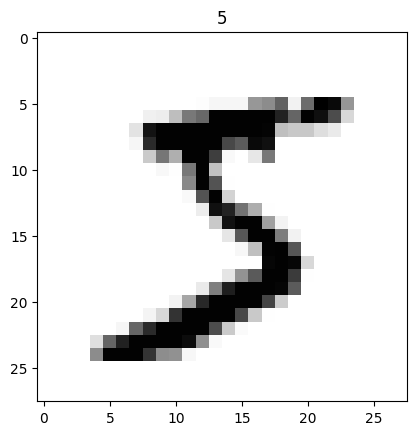

In [7]:
plt.imshow(img.permute(1,2,0),cmap="Greys")
plt.title(str(label))
plt.show()

In [8]:
train_dl=DataLoader(train_ds,batch_size=64,shuffle=True,num_workers=2,pin_memory=True)
valid_dl=DataLoader(train_ds,batch_size=128,shuffle=False,num_workers=2,pin_memory=True)

len(train_dl),len(valid_dl)

(938, 469)

In [11]:
from torchvision.utils import make_grid
import matplotlib.pyplot  as plt

def show_images(images:torch.Tensor,title=''):
  nrows=images.shape[0]//8
  grid=make_grid(images,nrow=nrows)
  grid=grid.permute(1,2,0)
  plt.imshow(grid,cmap='Greys')
  plt.axis('off')
  plt.grid(False)
  if title:
    plt.title(title)
  plt.show()

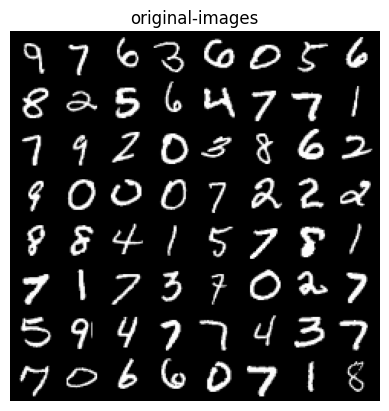

In [12]:
for images,_ in train_dl:
  show_images(images,'original-images')
  break

In [130]:
from torchvision.utils import make_grid
from collections import defaultdict

class ConvBlock(nn.Module):
  def __init__(self,out_channels,kernel_size,**kwargs):
    super().__init__()
    self.conv_block=nn.Sequential(
        nn.LazyConv2d(out_channels,kernel_size,**kwargs),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(inplace=True),
        nn.Dropout2d(0.2)
    )

  def forward(self,x):
    return self.conv_block(x)


class DeConvBlock(nn.Module):
  def __init__(self,out_channels,kernel_size,**kwargs):
    super().__init__()
    self.deconv_block=nn.Sequential(
        nn.LazyConvTranspose2d(out_channels,kernel_size,**kwargs),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(inplace=True),
        nn.Dropout2d(0.2)
    )

  def forward(self,x):
    return self.deconv_block(x)

class Reshape(nn.Module):
  def __init__(self,shape):
    super().__init__()
    self.shape=shape

  def forward(self,x):
    return x.reshape(self.shape)

class VAE(L.LightningModule):
  def __init__(self):
    super().__init__()
    self.latent_dim=8
    self.aplha=0.001 # weight for kl-divergence loss

    self.encoder=nn.Sequential(
        ConvBlock(8,7,padding='same'),

        ConvBlock(128,3,padding='same'),
        nn.MaxPool2d(2,2),# 14

        ConvBlock(128,3,padding='same'),
        nn.MaxPool2d(2,2),# 7

        ConvBlock(64,1,padding='same'),
        ConvBlock(64,3,padding='same'),
        nn.MaxPool2d(2,2),# 3

        ConvBlock(64,1,padding='same'),
        nn.Flatten(),
    )

    # To Sample Distribution
    self.z_mean=nn.LazyLinear(self.latent_dim)
    self.z_log_var=nn.LazyLinear(self.latent_dim)

    self.decoder=nn.Sequential(
        nn.LazyLinear(64*7*7),
        Reshape((-1,64,7,7)),

        DeConvBlock(128,3),
        DeConvBlock(128,3),
        nn.Upsample(scale_factor=2,mode='nearest'),

        DeConvBlock(64,1),
        DeConvBlock(64,3),
        nn.Upsample(scale_factor=2,mode='nearest'),
        DeConvBlock(1,1),

        nn.AdaptiveAvgPool2d((28,28)),
        nn.Sigmoid()
    )

    self.training_step_outputs=[]
    self.validation_step_outputs=[]

    self.reconstruction_loss=defaultdict(list)
    self.kl_divergence_loss=defaultdict(list)
    self.avg_loss=defaultdict(list)



  def forward(self,X):
    X=self.encoder(X)

    z_mean=self.z_mean(X)
    z_log_var=self.z_log_var(X)

    X=self.decoder(VAE.reparametrize(z_mean,z_log_var))
    return X,z_mean,z_log_var


  def configure_optimizers(self):
    return torch.optim.Adam(self.parameters(),lr=3e-2)



  def common_step(self,batch,split):
    X,_=batch
    gen_X,z_mean,z_log_var=self(X)
    reconstruction_loss=F.mse_loss(gen_X,X)
    kl_div_loss=VAE.KL_divergence_loss(z_mean,z_log_var)
    loss=reconstruction_loss+self.aplha*kl_div_loss

    self.avg_loss[split].append(loss.detach().cpu().item())
    self.kl_divergence_loss[split].append(loss.detach().cpu().item())
    self.reconstruction_loss[split].append(loss.detach().cpu().item())

    return loss

  def training_step(self,batch,batch_idx):
    loss=self.common_step(batch,'train')
    self.training_step_outputs.append(loss.detach().item())
    self.log("Train_Loss_Per_Batch",loss)
    return loss

  def validation_step(self,batch,batch_idx):
    if batch_idx==0:
      with torch.no_grad():
        X,_=batch
        gen_X,_,_=self(X)
        gen_X = torch.clamp(gen_X, 0.0, 1.0)
        nrow=X.shape[0]//8
        images=make_grid(gen_X,nrow=nrow)
        self.logger.experiment.add_image("generated_images",images,self.current_epoch)

    loss=self.common_step(batch,'validation')
    self.validation_step_outputs.append(loss.detach().item())
    self.log("Validation_Loss_Per_Batch",loss)
    return loss



  def on_train_epoch_end(self):
    avg_loss=torch.mean(torch.tensor(self.training_step_outputs)).item()
    self.log("Train_Loss_Per_Epoch",avg_loss)
    print(f"training-loss:{avg_loss:.4f}\n\n")
    self.training_step_outputs.clear()

  def on_validation_epoch_end(self):
    avg_loss=torch.mean(torch.tensor(self.validation_step_outputs)).item()
    self.log("Validation_Loss_Per_Epoch",avg_loss)
    print(f"validation-loss:{avg_loss:.4f}")
    self.validation_step_outputs.clear()


  def predict_step(self,batch,batch_idx):
    X,_=batch
    gen_X=self(X)
    return gen_X



  @staticmethod
  def reparametrize(z_mean,z_log_var):
    eps=torch.randn((z_mean.size(0),z_mean.shape[1])).to(z_mean.device)
    z=z_mean+eps*z_log_var
    return z

  @staticmethod
  def KL_divergence_loss(z_mean,z_log_var):
    kl_loss= -0.5 * torch.sum(1+z_log_var-z_mean**2-torch.exp(z_log_var),axis=1) # along latent dim
    kl_loss=kl_loss.mean()
    return kl_loss


In [131]:
model=VAE().to(DEVICE)
model

VAE(
  (encoder): Sequential(
    (0): ConvBlock(
      (conv_block): Sequential(
        (0): LazyConv2d(0, 8, kernel_size=(7, 7), stride=(1, 1), padding=same)
        (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
        (3): Dropout2d(p=0.2, inplace=False)
      )
    )
    (1): ConvBlock(
      (conv_block): Sequential(
        (0): LazyConv2d(0, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01, inplace=True)
        (3): Dropout2d(p=0.2, inplace=False)
      )
    )
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): ConvBlock(
      (conv_block): Sequential(
        (0): LazyConv2d(0, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, t

In [132]:
from torchsummary import summary
summary(model,(1,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 28, 28]             400
       BatchNorm2d-2            [-1, 8, 28, 28]              16
         LeakyReLU-3            [-1, 8, 28, 28]               0
         Dropout2d-4            [-1, 8, 28, 28]               0
         ConvBlock-5            [-1, 8, 28, 28]               0
            Conv2d-6          [-1, 128, 28, 28]           9,344
       BatchNorm2d-7          [-1, 128, 28, 28]             256
         LeakyReLU-8          [-1, 128, 28, 28]               0
         Dropout2d-9          [-1, 128, 28, 28]               0
        ConvBlock-10          [-1, 128, 28, 28]               0
        MaxPool2d-11          [-1, 128, 14, 14]               0
           Conv2d-12          [-1, 128, 14, 14]         147,584
      BatchNorm2d-13          [-1, 128, 14, 14]             256
        LeakyReLU-14          [-1, 128,

In [133]:
print("Encoder:")
summary(model.encoder,(1,28,28))
print("\nDecoder:")
summary(model.decoder,(8,))

Encoder:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 28, 28]             400
       BatchNorm2d-2            [-1, 8, 28, 28]              16
         LeakyReLU-3            [-1, 8, 28, 28]               0
         Dropout2d-4            [-1, 8, 28, 28]               0
         ConvBlock-5            [-1, 8, 28, 28]               0
            Conv2d-6          [-1, 128, 28, 28]           9,344
       BatchNorm2d-7          [-1, 128, 28, 28]             256
         LeakyReLU-8          [-1, 128, 28, 28]               0
         Dropout2d-9          [-1, 128, 28, 28]               0
        ConvBlock-10          [-1, 128, 28, 28]               0
        MaxPool2d-11          [-1, 128, 14, 14]               0
           Conv2d-12          [-1, 128, 14, 14]         147,584
      BatchNorm2d-13          [-1, 128, 14, 14]             256
        LeakyReLU-14          

In [172]:
from lightning import Trainer
from lightning.pytorch.callbacks import EarlyStopping
from lightning.pytorch.loggers import TensorBoardLogger

logger=TensorBoardLogger(".")
DEVICE='cuda' if torch.cuda.is_available() else 'cpu'
epochs=15
early_stopping=EarlyStopping(monitor='Validation_Loss_Per_Epoch',mode='min',patience=3,min_delta=0.001)

trainer=Trainer(accelerator=DEVICE,devices='auto',logger=logger,fast_dev_run=False,max_epochs=epochs,enable_progress_bar=True,callbacks=[early_stopping])

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [173]:
trainer.fit(model,train_dl,valid_dl)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | Sequential | 207 K  | train
1 | z_mean    | Linear     | 4.6 K  | train
2 | z_log_var | Linear     | 4.6 K  | train
3 | decoder   | Sequential | 295 K  | train
-------------------------------------------------
512 K     Trainable params
0         Non-trainable params
512 K     Total params
2.050     Total estimated model params size (MB)
80        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name      | Type       | Params | Mode 
-------------------------------------------------
0 | encoder   | Sequential | 207 K  | train
1 | z_mean    | Linear     | 4.6 K  | train
2 | z_log_var | Linear     | 4.6 K  | train
3 | decoder   | Sequential | 295 K  | train
-------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0406


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0406
training-loss:0.0747




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0390
training-loss:0.0740




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0383
training-loss:0.0740




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0370
training-loss:0.0731




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0360
training-loss:0.0730




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0349
training-loss:0.0725




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0350
training-loss:0.0721




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0342
training-loss:0.0723




Validation: |          | 0/? [00:00<?, ?it/s]

validation-loss:0.0342
training-loss:0.0720




In [71]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

In [141]:
len(model.avg_loss['train']),len(model.avg_loss['validation'])

(14072, 7039)

In [151]:
sns.set_style('whitegrid')

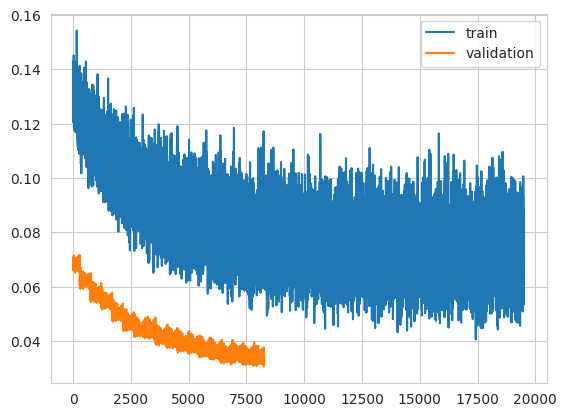

In [174]:
plt.plot(model.avg_loss['train'][3000:],label='train')
plt.plot(model.avg_loss['validation'][3000:],label='validation')
plt.legend()
plt.show()

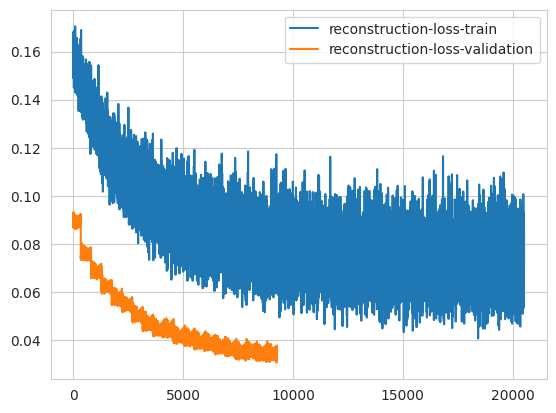

In [175]:
plt.plot(model.reconstruction_loss['train'][2000:],label='reconstruction-loss-train')
plt.plot(model.reconstruction_loss['validation'][2000:],label='reconstruction-loss-validation')
plt.legend()
plt.show()

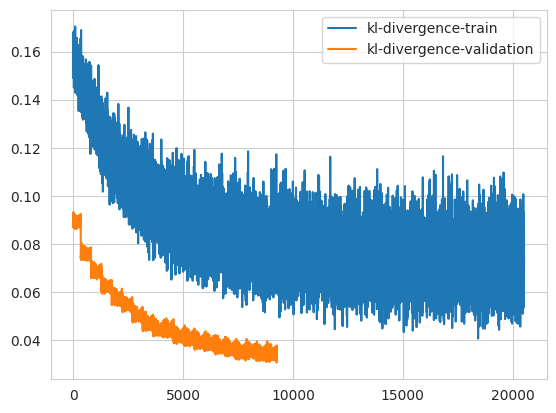

In [176]:
plt.plot(model.kl_divergence_loss['train'][2000:],label='kl-divergence-train')
plt.plot(model.kl_divergence_loss['validation'][2000:],label='kl-divergence-validation')
plt.legend()
plt.show()

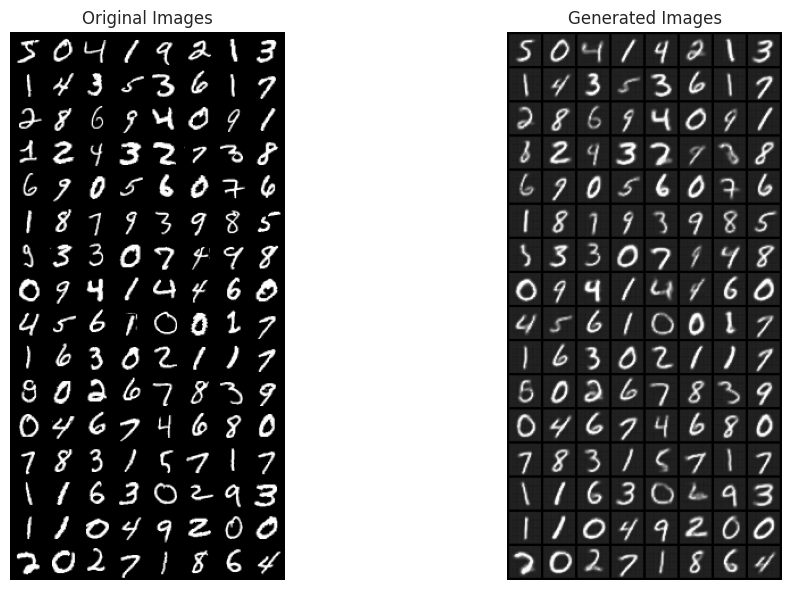

In [177]:
with torch.no_grad():
    model.eval()
    for images, _ in valid_dl:
      gen_images, _, _ = model(images)

      images_grid = make_grid(images, nrow=8)
      gen_images_grid = make_grid(gen_images, nrow=8)

      plt.figure(figsize=(12, 6))

      # Display original images
      plt.subplot(1, 2, 1)
      plt.imshow(images_grid.permute(1, 2, 0).cpu().numpy(), cmap="Greys")
      plt.axis('off')
      plt.title('Original Images')

      # Display generated images
      plt.subplot(1, 2, 2)
      plt.imshow(gen_images_grid.permute(1, 2, 0).cpu().numpy(), cmap="Greys")
      plt.axis('off')
      plt.title('Generated Images')

      plt.tight_layout()
      plt.show()

      break

    model.train()


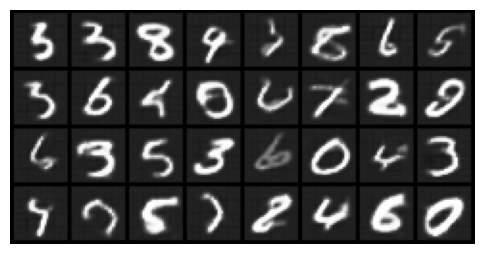

In [180]:
with torch.no_grad():
  model.eval()
  sample=torch.randn((32,model.latent_dim))
  gen_images=model.decoder(sample).detach().cpu()
  grid=make_grid(gen_images,nrow=8)
  plt.figure(figsize=(6,6))
  plt.imshow(grid.permute(1,2,0))
  plt.axis('off')
  model.train()